In [1]:
!pip install wget

/bin/bash: /opt/conda/lib/libtinfo.so.6: no version information available (required by /bin/bash)
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=86d8f2f8821a5095004ebf93f0e0dc01f01d2285a1088be1d6fb5f407816e7c2
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [2]:
# Import the necessaries libraries
import wget
import PIL.Image
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import sys, os, re, warnings, string
import nltk
import nltk.corpus

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [3]:
# pandas configuration 
pd.set_option('display.max_colwidth', 100) # for automatic linebreaks and multi-line cells.
pd.set_option('display.max_columns', 100) 
pd.set_option('display.width', 1000)

# ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# English stop words
STOPWORDS = set(nltk.corpus.stopwords.words('english')) 

# download cloud word mask image
mask_url = 'https://media.self.com/photos/622912847b959736301bfb91/2:1/w_1280,c_limit/GettyImages-1301412050.jpg'
mask_wordcloud = wget.download(mask_url)
mask_wordcloud

'GettyImages-1301412050.jpg'

In [4]:
df_recipes = pd.read_csv("../input/food-com-recipes-and-user-interactions//RAW_recipes.csv")
df_interactions = pd.read_csv("../input/food-com-recipes-and-user-interactions/RAW_interactions.csv")
df = pd.concat([df_recipes, df_interactions], axis=1, join='inner')
df.head(1)

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course', 'main-ingredient', 'cuisine', 'preparation', 'o...","[51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0]",11,"['make a choice and proceed with recipe', 'depending on size of squash , cut into half or fourth...",autumn is my favorite time of year to cook! this recipe \r\ncan be prepared either spicy or swee...,"['winter squash', 'mexican seasoning', 'mixed spice', 'honey', 'butter', 'olive oil', 'salt']",7,38094,40893,2003-02-17,4,Great with a salad. Cooked on top of stove for 15 minutes.Added a shake of cayenne and a pinch o...


In [5]:
print(f"Length of merged dataset: {len(df.index):,}")

Length of merged dataset: 231,637


Get numbers of non value cells in each column in the dataframe.

In [6]:
df.isnull().sum()

name                 1
id                   0
minutes              0
contributor_id       0
submitted            0
tags                 0
nutrition            0
n_steps              0
steps                0
description       4979
ingredients          0
n_ingredients        0
user_id              0
recipe_id            0
date                 0
rating               0
review              46
dtype: int64

It shows that 2 columns only have non value cells. description column with 4979 nan cell and review column with 46 cell.

To-Do:
    
    If description or review columns is important for the analysis then leaiving the column without droping its null rows is the best option
    else then droping its null rows is better.

In [7]:
def diff_dataframes(df_before, df_after) -> int:
    """
    Parameters
        ----------
        df_before : pandas.DataFrame
            First DataFrame
        df_after : pandas.DataFrame
            Second DataFrame
    Return: 
        ----------
        The diffrence between two dataframes rows number
    """
    diff = df_before.shape[0] - df_after.shape[0]
    print(f"Dropped Rows: {diff:,}")
    return diff

In [8]:
df_dropna = df.dropna()
diff_dataframes(df, df_dropna)
#df = df_dropna

Dropped Rows: 5,026


5026

Some recipe names contains some numbers like 0 or 123. 
To-do:-
    
    - remove numbers from 'name' column

In [9]:
df['name'] = df.name\
    .str.replace('\d+', '')\
    .str.lower()

# Dates
Date representted in two columns in the merged dataframe ['submitted', 'date']. 

Both columns as string data-type.

To-Do:

    - Convert string date to pandas date-type.
    - Extract 'year' only from both date columns in new columns.
    - Drop processed columns.

In [10]:
df[["date", "submitted"]] = df[["date", "submitted"]].apply(pd.to_datetime)
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['submitted_year'] = df['submitted'].dt.year
df['submitted_month'] = df['submitted'].dt.month

# Split Nutrition column

Nutrition column represented as string-type starts and ends with brackets contains number of 7 nutrition.

    calories (#)
    total fat (PDV)
    sugar (PDV)
    sodium (PDV)
    protein (PDV)
    saturated fat (PDV)
    carbohydrates (PDV)
    
To-Do
    
    Remove brackets fo every nutrition cell.
    Split nutrition cell to 7 new columns in new DataFrame.
    Concatenate processed DataFrame and nutrition DataFrame.
    Drop nutrition column.
    

In [11]:
nutrition = ['calories', 'totalFat', 'sugar', 'sodium', 'protein', 'saturatedFat', 'carbohydrates']
df['nutrition'] = df['nutrition'].str.replace('[','').str.replace(']','')
nutrition_df = df['nutrition'].str.split(',', n=6, expand=True).astype("float32")
nutrition_df.columns = nutrition
nutrition_df.head()

,calories,totalFat,sugar,sodium,protein,saturatedFat,carbohydrates
0,51.500000,0.0,13.0,0.0,2.0,0.0,4.0
1,173.399994,18.0,0.0,17.0,22.0,35.0,1.0
2,269.799988,22.0,32.0,48.0,39.0,27.0,5.0
3,368.100006,17.0,10.0,2.0,14.0,8.0,20.0
4,352.899994,1.0,337.0,23.0,3.0,0.0,28.0


In [12]:
nutrition_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231637 entries, 0 to 231636
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   calories       231637 non-null  float32
 1   totalFat       231637 non-null  float32
 2   sugar          231637 non-null  float32
 3   sodium         231637 non-null  float32
 4   protein        231637 non-null  float32
 5   saturatedFat   231637 non-null  float32
 6   carbohydrates  231637 non-null  float32
dtypes: float32(7)
memory usage: 6.2 MB


In [13]:
df = pd.concat([df, nutrition_df], axis=1, join='inner')
del(nutrition_df)
df.head(2)

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review,year,month,submitted_year,submitted_month,calories,totalFat,sugar,sodium,protein,saturatedFat,carbohydrates
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course', 'main-ingredient', 'cuisine', 'preparation', 'o...","51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0",11,"['make a choice and proceed with recipe', 'depending on size of squash , cut into half or fourth...",autumn is my favorite time of year to cook! this recipe \r\ncan be prepared either spicy or swee...,"['winter squash', 'mexican seasoning', 'mixed spice', 'honey', 'butter', 'olive oil', 'salt']",7,38094,40893,2003-02-17,4,Great with a salad. Cooked on top of stove for 15 minutes.Added a shake of cayenne and a pinch o...,2003,2,2005,9,51.500000,0.0,13.0,0.0,2.0,0.0,4.0
1,a bit different breakfast pizza,31490,30,26278,2002-06-17,"['30-minutes-or-less', 'time-to-make', 'course', 'main-ingredient', 'cuisine', 'preparation', 'o...","173.4, 18.0, 0.0, 17.0, 22.0, 35.0, 1.0",9,"['preheat oven to 425 degrees f', 'press dough into the bottom and sides of a 12 inch pizza pan'...",this recipe calls for the crust to be prebaked a bit before adding ingredients. feel free to cha...,"['prepared pizza crust', 'sausage patty', 'eggs', 'milk', 'salt and pepper', 'cheese']",6,1293707,40893,2011-12-21,5,"So simple, so delicious! Great for chilly fall evening. Should have doubled it ;)<br/><br/>Secon...",2011,12,2002,6,173.399994,18.0,0.0,17.0,22.0,35.0,1.0


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231637 entries, 0 to 231636
Data columns (total 28 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   name             231636 non-null  object        
 1   id               231637 non-null  int64         
 2   minutes          231637 non-null  int64         
 3   contributor_id   231637 non-null  int64         
 4   submitted        231637 non-null  datetime64[ns]
 5   tags             231637 non-null  object        
 6   nutrition        231637 non-null  object        
 7   n_steps          231637 non-null  int64         
 8   steps            231637 non-null  object        
 9   description      226658 non-null  object        
 10  ingredients      231637 non-null  object        
 11  n_ingredients    231637 non-null  int64         
 12  user_id          231637 non-null  int64         
 13  recipe_id        231637 non-null  int64         
 14  date             231

ٍSome columns like 'ingredients', 'tags', 'steps' and 'ingredients' are represented as string-type starts and ends with brackets. They contains string-type sentences/words splitted with comma.

To-Do:

    Remove brackets in every cell.
    Convert digits into words.

In [15]:
def convert_to_list(data):
    data = data.astype(str)
    data = data.str.replace('[','')\
        .str.replace(']','')\
        .str.replace('\'','')\
        .str.replace("'", '')\
        .str.replace("-", ' ')
    return data

In [16]:
df['ingredients'] = convert_to_list(df['ingredients'])
df['ingredients'][0]

'winter squash, mexican seasoning, mixed spice, honey, butter, olive oil, salt'

In [17]:
df["description"] = convert_to_list(df["description"])
df['description'][0]

'autumn is my favorite time of year to cook! this recipe \r\ncan be prepared either spicy or sweet, your choice!\r\ntwo of my posted mexican inspired seasoning mix recipes are offered as suggestions.'

In [18]:
df['tags'] = convert_to_list(df['tags'])
df['tags'][0]

'60 minutes or less, time to make, course, main ingredient, cuisine, preparation, occasion, north american, side dishes, vegetables, mexican, easy, fall, holiday event, vegetarian, winter, dietary, christmas, seasonal, squash'

Check all unique tags.

In [19]:
all_tags = df.tags.str.split(', ')
unique_tags = sorted(all_tags.explode().unique())

print(unique_tags[:15])

['', '1 day or more', '15 minutes or less', '3 steps or less', '30 minutes or less', '4 hours or less', '5 ingredients or less', '60 minutes or less', 'Throw the ultimate fiesta with this sopaipillas recipe from Food.com.', 'a1 sauce', 'african', 'american', 'amish mennonite', 'angolan', 'appetizers']


In [20]:
from collections import Counter
from itertools import chain

all_tags_count = Counter(chain(*all_tags))
all_tags_count = all_tags_count.most_common()
all_tags_count[:5]

[('preparation', 230546),
 ('time to make', 225326),
 ('course', 218148),
 ('main ingredient', 170446),
 ('dietary', 165091)]

Tags as a plot vs their count

Text(0.5, 1.0, 'Most used tags')

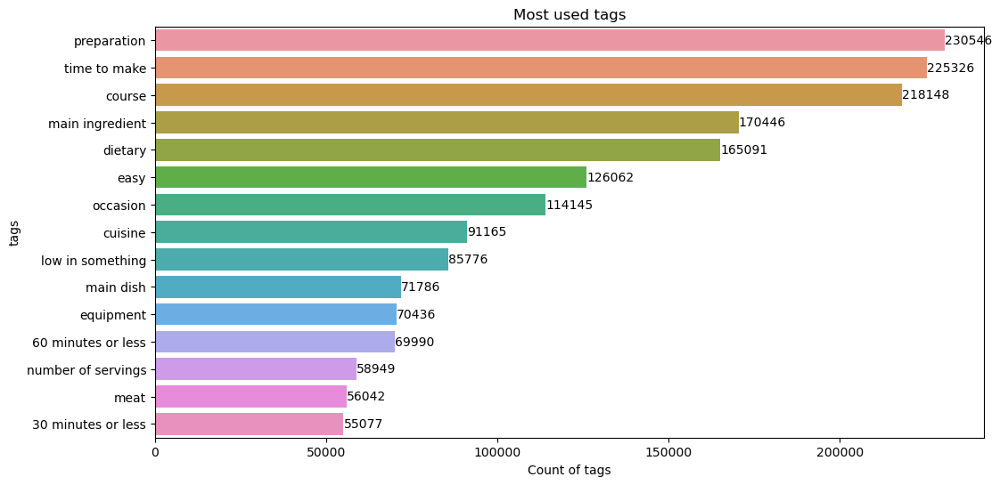

In [21]:
y = [all_tags_count[i][0] for i in range(15)]
x = [all_tags_count[i][1] for i in range(15)]

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=x, y=y)

for bars in ax.containers:
     ax.bar_label(bars)
        
plt.ylabel("tags")
plt.xlabel("Count of tags")
plt.title("Most used tags")

The 'tags' column contain a list of diffrent words describe the recipe. It help extracting new columns like vegan and vegetarian.

To-do:

    Create 2 columns for vegan and vegetarian.
    Create a third one for diet.

In [22]:
# Add vegetarian and vegan boolean columns
df['vegetarian'] = df['tags'].str.contains('vegetarian')
df['vegan'] = df['tags'].str.contains('vegan')
df.tags[0], df.vegetarian[0]

('60 minutes or less, time to make, course, main ingredient, cuisine, preparation, occasion, north american, side dishes, vegetables, mexican, easy, fall, holiday event, vegetarian, winter, dietary, christmas, seasonal, squash',
 True)

In [23]:
def diet_conditions(df):
    if not df['vegetarian'] and not df['vegan']:
        return 'regular'
    elif df['vegetarian'] and not df['vegan']:
        return 'vegetarian'
    else:
        return 'vegan'
    
df['diet'] = df.apply(diet_conditions, axis=1)
df.drop(columns=['vegetarian', 'vegan'], inplace=True)
df.head(1)

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review,year,month,submitted_year,submitted_month,calories,totalFat,sugar,sodium,protein,saturatedFat,carbohydrates,diet
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"60 minutes or less, time to make, course, main ingredient, cuisine, preparation, occasion, north...","51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0",11,"['make a choice and proceed with recipe', 'depending on size of squash , cut into half or fourth...",autumn is my favorite time of year to cook! this recipe \r\ncan be prepared either spicy or swee...,"winter squash, mexican seasoning, mixed spice, honey, butter, olive oil, salt",7,38094,40893,2003-02-17,4,Great with a salad. Cooked on top of stove for 15 minutes.Added a shake of cayenne and a pinch o...,2003,2,2005,9,51.5,0.0,13.0,0.0,2.0,0.0,4.0,vegetarian


### Recalculate number of steps

Trying to calculate number of steps by:

    - Removing brackets from string.
    - Splitting steps column by comma.
    - Calculating the length list of steps.

In [24]:
df['steps'] = df['steps']\
    .str.replace('[','')\
    .str.replace(']','')\
    .str.replace('\'','')

In [25]:
# n splits ',' + 1
#df['N_steps'] = df['steps'].str.count(',')+1
df['N_steps'] = df['steps'].apply(lambda a: len(list(a.split(', '))))

In [26]:
df[df.n_steps == 1][['name', 'steps', 'n_steps', 'N_steps']].head(1)

,name,steps,n_steps,N_steps
92,stove top bbq beef or pork ribs,"cut all ribs into serving size pieces sprinkle ribs with salt in a dutch oven , brown ribs on al...",1,4


Review column can have some preprocessing.

    - Converting to string-type for some Nulls to be empty string''.
    - Converting to lowercase
    - Removing HTML tags
    - convert digits to words.
    - Removing Punctuations
    - Snowball Stemming 
    - Removing stopwords
     

In [27]:
def remove_punctuation(text):
    """
    Parameters:
        ----
        test: string
    Return:
        ----
        A text after removing punctuation.
    """
    translator = str.maketrans('', '', string.punctuation)
    return text.translate(translator)
 
input_str = "Hey, did you know that the summer break is coming? Amazing right !! It's only 5 more days !!"
remove_punctuation(input_str)

'Hey did you know that the summer break is coming Amazing right  Its only 5 more days '

In [28]:
# as per recommendation from @freylis, compile once only
CLEANR = re.compile('<.*?>') 
# Some HTML texts can also contain entities that are not enclosed in brackets, such as '&nsbm'.
CLEANR = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')

def cleanhtml(raw_html):
    cleantext = re.sub(CLEANR, '', raw_html)
    return cleantext

In [29]:
def review_preprocessing(sentence, stem=None)->str:
    """
        Parameters
        ----------
        sentence : String
    Return: 
        ----------
        The sentence after applying diffrent preprocessing methods.
    """
    #if type(sentence) is not str: 
    #    print(sentence)
    #assert( type(sentence) is str )
    sentence = str(sentence)
    # Converting to lowercase
    sentence = sentence.lower() 
    # Removing HTML tags
    sentence = cleanhtml(sentence)      
    # Removing Punctuations
    #sentence = re.sub(r'[?|!|\'|"|#]', r'',sentence)
    #sentence = re.sub(r'[.|,|)|(|\|/]', r' ',sentence)      
    sentence = remove_punctuation(sentence)
    
    if stem == 'stem':
    # Stemming and removing stopwords
        snow = nltk.stem.SnowballStemmer('english')
        words = [snow.stem(word) for word in sentence.split() if word not in STOPWORDS] 
    elif stem == 'lemmatize':
        # WordNetLemmatizing
        lemmatizer = nltk.stem.WordNetLemmatizer()
        words = [lemmatizer.lemmatize(word) for word in sentence.split() if word not in STOPWORDS] 
    else: 
        words = [word for word in sentence.split() if word not in STOPWORDS] 
        
    # Remove dublicated words
    sentence = " ".join(sorted(set(words), key=words.index))
    return sentence

df['clean_review'] = df['review'].apply(review_preprocessing)
df[['name', 'review', 'clean_review']].head(1)

,name,review,clean_review
0,arriba baked winter squash mexican style,Great with a salad. Cooked on top of stove for 15 minutes.Added a shake of cayenne and a pinch o...,great salad cooked top stove 15 minutesadded shake cayenne pinch salt used low fat sour cream th...


Some processed columns need to be dropped processed columns.

In [30]:
df.drop(columns=['nutrition', 'n_steps', 'review'], inplace=True)

# Check outliers using box plot
Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

In [31]:
def BoxPlot(df, columns):
    plt.style.use('ggplot')
    n = len(columns)
    if n % 2 == 0:
        fig, axis = plt.subplots(2, int(n/2), figsize=(20, 10))
    elif n % 3 == 0:
        fig, axis = plt.subplots(3, n/3, figsize=(20, 15))
    else:
        fig, axis = plt.subplots(1, n, figsize=(20, 5))
    axis = axis.ravel()

    for index, ax in enumerate(axis):
        sns.boxplot(
            data = df[check_ouliers_column[index]], 
            ax = ax
        )
        ax.set(title = check_ouliers_column[index])

    plt.tight_layout()
    plt.show()

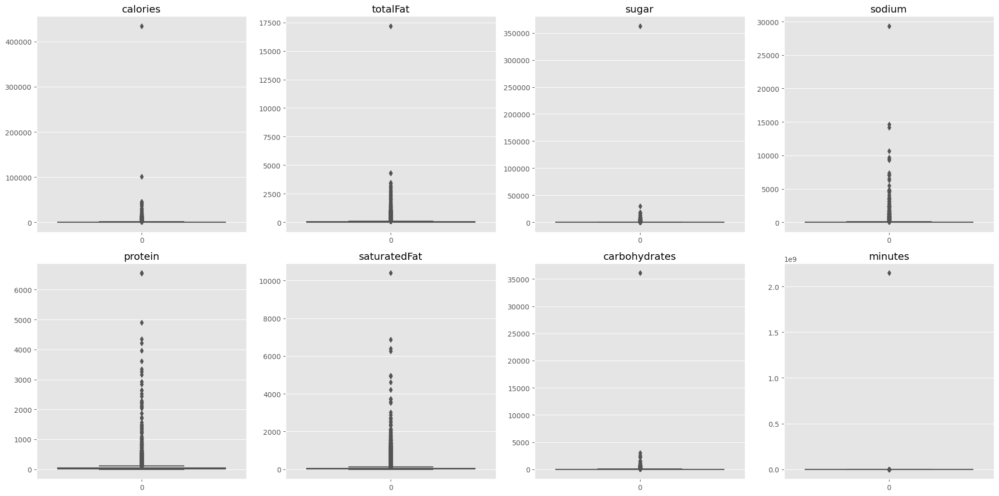

In [32]:
check_ouliers_column = nutrition + ['minutes']
BoxPlot(df, check_ouliers_column)

Some data columns have many outlier points need to be cleaned.

## Remove Outliers:
    - lower bound = Q1 - 1.5 * IQR 
    - upper bound = Q3 + 1.5 * IQR.

In [33]:
# remove outliers
def remove_outliers(df, columns, min_q=0.05, max_q=0.95, ratio=1.5):
    """
    Parameters
        ----------
        df : pandas.DataFrame
            DataFrame
        columns : List
            Calumns names 
        min_q : minimum quantile
        max_q : maximam quantile
        ratio : ratio
    Return: 
        ----------
        pandas.DataFrame after removing outliers out of minimum and minimum quartiles.
    """
    for colunm in columns:
        # IQR(Interquartile range): defines the range covered by minimum and minimum quartiles.
        IQR = df[colunm].quantile(max_q) - df[colunm].quantile(min_q)
        colmin = df[colunm].quantile(min_q) - ratio * IQR
        colmax = df[colunm].quantile(max_q) + ratio * IQR
        df = df[ (df[colunm] < colmax) & (df[colunm] > colmin) ]
    return df

df_cleaned = remove_outliers(df, check_ouliers_column)
print(diff_dataframes(df, df_cleaned))
df = df_cleaned

Dropped Rows: 14,044
14044


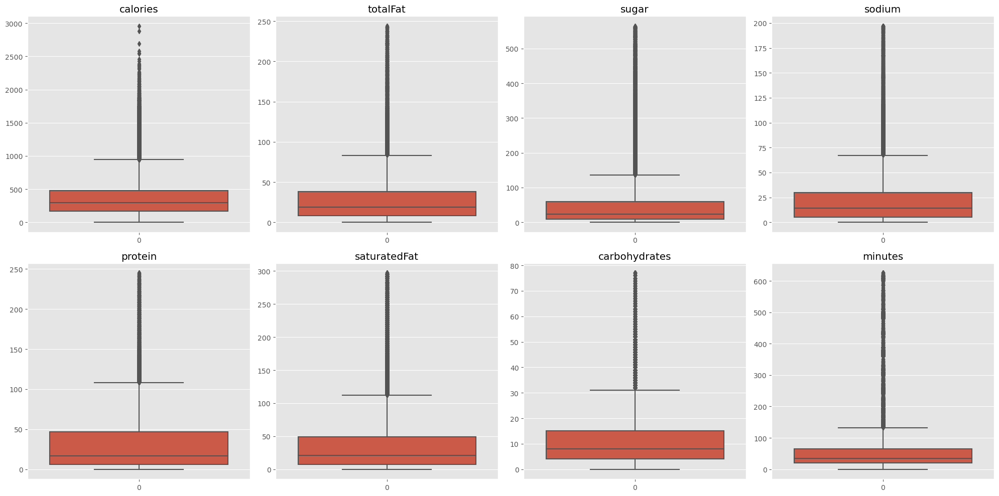

In [34]:
BoxPlot(df, check_ouliers_column)

In [35]:
df.sort_values('minutes', ascending=False).head(1)

,name,id,minutes,contributor_id,submitted,tags,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,year,month,submitted_year,submitted_month,calories,totalFat,sugar,sodium,protein,saturatedFat,carbohydrates,diet,N_steps,clean_review
20685,beef stew with barley crock pot,53404,625,51669,2003-02-04,"weeknight, time to make, course, main ingredient, preparation, occasion, main dish, beef, fall, ...","brown meat with chopped onion in oil and transfer to 6 quart crock pot, add remaining ingredient...","this non gravy stew recipe is a combination of many recipes, tailored to the flavours i like bes...","stewing beef, cooking oil, onion, barley, dried thyme, dried marjoram, dried rosemary, black pep...",15,33443,44987,2003-12-22,4,2003,12,2003,2,313.399994,10.0,20.0,27.0,52.0,11.0,13.0,regular,7,good used sharp cheddar added fresh ground black pepper found bit bland served canned tomatoes t...


Plotting a distribution of number of steps after cutting some outliers.

Unique number of steps: 125
Max number of steps: 152
Min number of steps: 1


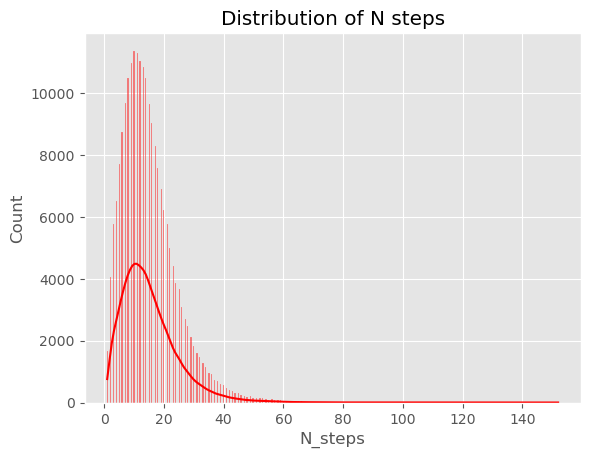

In [36]:
print(f"Unique number of steps: {len(df.N_steps.unique())}")
print(f"Max number of steps: {max(df.N_steps.unique())}")
print(f"Min number of steps: {min(df.N_steps.unique())}")

#sns.kdeplot(data=df['N_steps'], shade=True);
sns.histplot(df['N_steps'], kde=True, color='r')
plt.title("Distribution of N steps");

    Therefore, number of strps is mostly somewhere between 0 to 30.

Plotting a distribution of number of ingredients after cutting some outliers.

Unique number of ingredients: 41
Max number of ingredients: 43
Min number of ingredients: 1


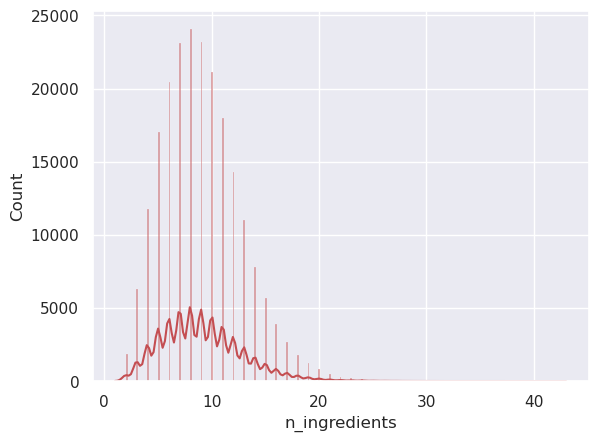

In [37]:
print(f"Unique number of ingredients: {len(df.n_ingredients.unique())}")
print(f"Max number of ingredients: {max(df.n_ingredients.unique())}")
print(f"Min number of ingredients: {min(df.n_ingredients.unique())}")
#fig = px.histogram(df, x="n_ingredients", title="Distribution of N ingredients")
sns.set(style="darkgrid")
#sns.kdeplot(data=df['n_ingredients'], shade=True);
sns.histplot(df['n_ingredients'], kde=True, color='r');

    Therefore, number of ingredients is mostly somewhere between 0 to 15.

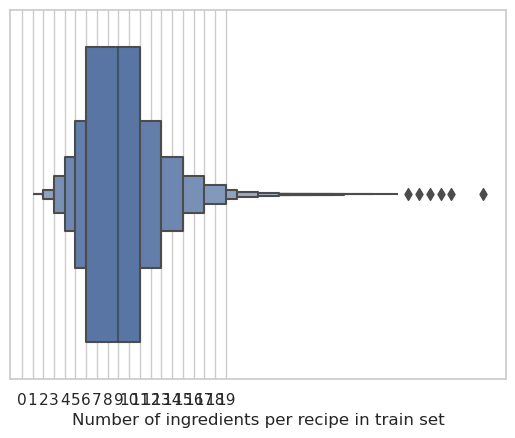

In [38]:
sns.set(style = "whitegrid")
ax = sns.boxenplot(x = df['n_ingredients'])
ax.set_xticks(np.arange(0,20))
ax.set_xlabel('Number of ingredients per recipe in train set')
plt.show()

Plotting a distribution of number of making time in minutes after cutting some outliers.

Unique making time 'minutes': 400
Max making time 'minutes': 625
Min making time 'minutes': 0


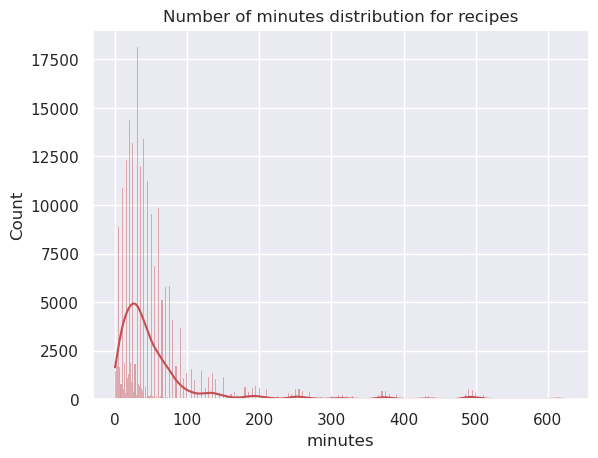

In [39]:
print(f"Unique making time 'minutes': {len(df.minutes.unique())}")
print(f"Max making time 'minutes': {max(df.minutes.unique())}")
print(f"Min making time 'minutes': {min(df.minutes.unique())}")
#fig = px.histogram(df, x="minutes", title="Distribution of Recipe Making Time")
#fig.show()
sns.set(style="darkgrid")
#sns.kdeplot(data=df['minutes'], shade=True);
sns.histplot(df['minutes'], kde=True, color='r')
plt.title('Number of minutes distribution for recipes');

    So, a good amount of recipes are among the duration of 0-100 mins.

Zero minutes recipes:  907


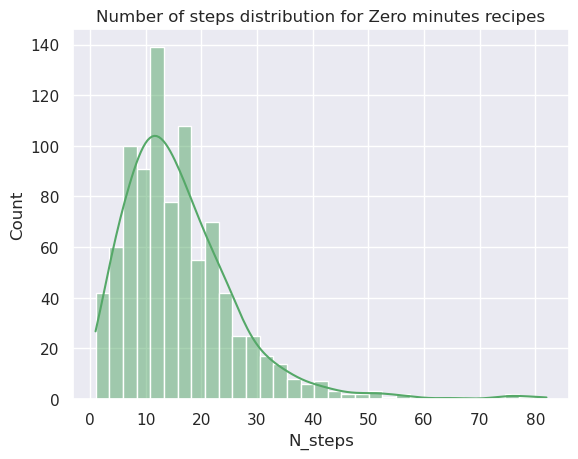

In [40]:
zero_minutes_df = df[df.minutes==0]
print(f'Zero minutes recipes:  {len(zero_minutes_df)}')

sns.histplot(zero_minutes_df['N_steps'], kde=True, color='g')
#sns.kdeplot(data=zero_minutes_df['N_steps'], shade=True);
plt.title('Number of steps distribution for Zero minutes recipes');

    Number of steps for most of Zero minutes recipes are between 0 and 40 step which can not be a zero minute!

Some values in name column 'recipes' are dublicated.

To-do:

    - Choose the recipe with best ratting and drop the rest

In [41]:
names = df.name
duplicated_names = df[
    names.isin(
        names[names.duplicated()]
    )
].sort_values(["name", "rating"], ascending= False)

duplicated_names.head(1)

,name,id,minutes,contributor_id,submitted,tags,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,year,month,submitted_year,submitted_month,calories,totalFat,sugar,sodium,protein,saturatedFat,carbohydrates,diet,N_steps,clean_review
231113,zucchini cilantro dip,4636,15,1939,1999-11-17,"15 minutes or less, time to make, course, preparation, appetizers, dips, number of servings","line a large baking sheet with a clean dish towel, spread zucchini over towel, sprinkle with 3 /...",nan,"zucchini, garbanzo beans, cilantro leaf, garlic, seasoned rice vinegar with roasted garlic, oliv...",7,678366,379974,2009-11-21,5,2009,11,1999,11,745.299988,68.0,47.0,31.0,40.0,30.0,25.0,regular,24,tagged realised made 5 minute artizan bread called thinkand ive using since found recipe great t...


In [42]:
#df = df.sort_values(["name", "rating"], ascending= False)\
#        .drop_duplicates(subset=["name", "rating"], keep="first")

Plotting the rating distribution for recipes.

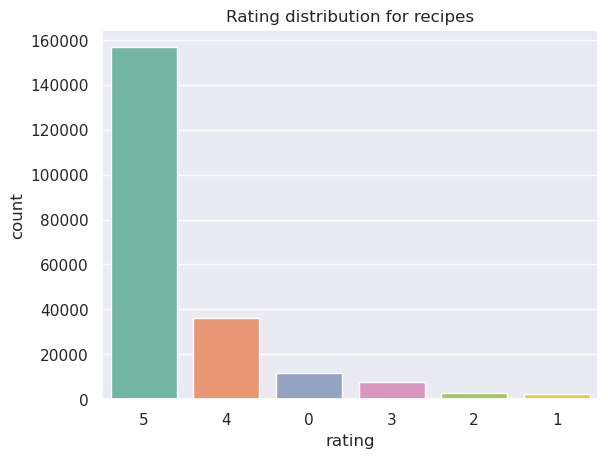

In [43]:
sns.set(style="darkgrid")
ax = sns.countplot(x="rating", data=df, palette="Set2", order=df['rating'].value_counts().index[:15])
plt.title("Rating distribution for recipes");

Plotting the rating distribution for recipes.

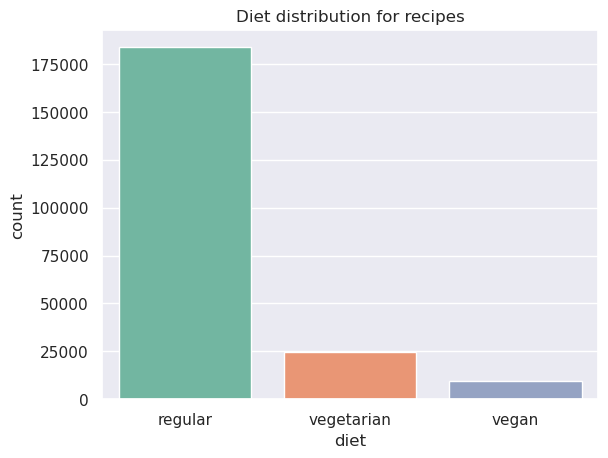

In [44]:
sns.set(style="darkgrid")
sns.countplot(x="diet", data=df, palette="Set2", order=df['diet'].value_counts().index[:15])
plt.title("Diet distribution for recipes");

Create a Sentiment column for Positive/Negative based on ratings

In [45]:
#df['sentiment'] = df.rating.apply(lambda x: 'Positive' if x > 3 else 'Negative')

Plotting the number of recipes by year for each diet.

In [46]:
df_veg = df.groupby(['year', 'diet']).agg(
    recipe_count = ('id', 'count')
).reset_index()
df_veg.head()

,year,diet,recipe_count
0,2000,regular,22
1,2000,vegan,1
2,2000,vegetarian,2
3,2001,regular,484
4,2001,vegan,41


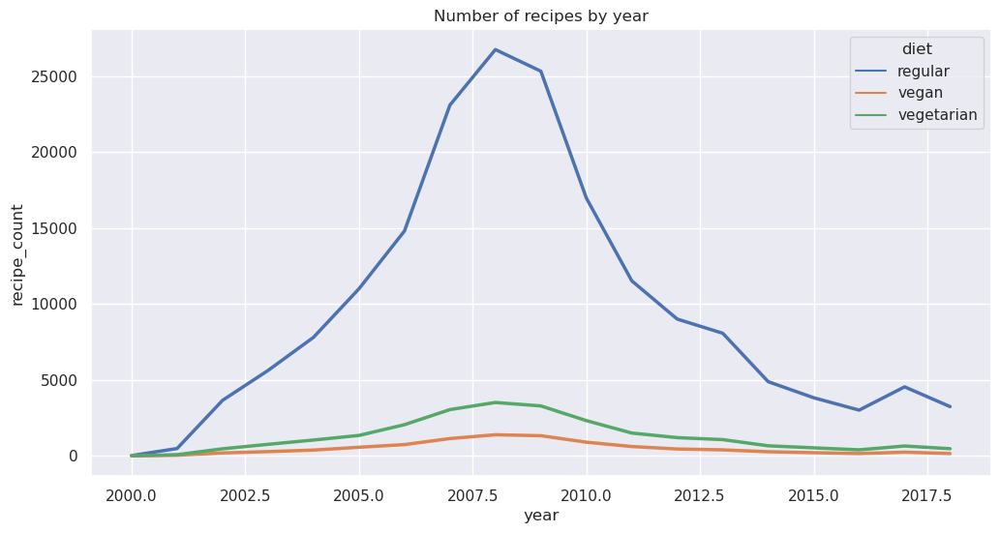

In [47]:
plt.figure(figsize=(12,6))

ax = sns.lineplot(
    data = df_veg, 
    x = 'year', 
    y = 'recipe_count', 
    hue = 'diet', 
    linewidth = 2.5
);

ax.set_title('Number of recipes by year');

Correlation plot as heat map.

In [48]:
corr_columns = [ 'minutes', 'n_ingredients', 'rating', 'calories', 'totalFat', 'sugar', 'sodium', 'protein', 'saturatedFat', 'carbohydrates', 'N_steps']
df_corr = df[corr_columns].corr()
#plt.figure(figsize=(20, 20));
#sns.heatmap(df_corr, annot=True);
df_corr.style.background_gradient(cmap='YlGn') # coolwarm YlGn BuGn

,minutes,n_ingredients,rating,calories,totalFat,sugar,sodium,protein,saturatedFat,carbohydrates,N_steps
minutes,1.000000,0.165729,0.000291,0.123642,0.089099,0.024154,0.114346,0.191158,0.084845,0.044629,0.146198
n_ingredients,0.165729,1.000000,-0.000359,0.240270,0.177139,0.005621,0.219384,0.252795,0.127587,0.162257,0.526027
rating,0.000291,-0.000359,1.000000,0.003330,0.004860,-0.000445,0.002642,0.002220,0.004550,-0.000573,-0.003434
calories,0.123642,0.240270,0.003330,1.000000,0.868363,0.321272,0.501339,0.662777,0.762466,0.645634,0.208971
totalFat,0.089099,0.177139,0.004860,0.868363,1.000000,0.130183,0.417384,0.529434,0.861864,0.272657,0.164360
sugar,0.024154,0.005621,-0.000445,0.321272,0.130183,1.000000,-0.011344,-0.112536,0.168883,0.628569,0.036341
sodium,0.114346,0.219384,0.002642,0.501339,0.417384,-0.011344,1.000000,0.511728,0.348547,0.259969,0.100135
protein,0.191158,0.252795,0.002220,0.662777,0.529434,-0.112536,0.511728,1.000000,0.444642,0.168664,0.172980
saturatedFat,0.084845,0.127587,0.004550,0.762466,0.861864,0.168883,0.348547,0.444642,1.000000,0.270097,0.167310
carbohydrates,0.044629,0.162257,-0.000573,0.645634,0.272657,0.628569,0.259969,0.168664,0.270097,1.000000,0.150116


In [49]:
nutrition_columns = ['calories', 'totalFat', 'sugar', 'sodium', 'protein', 'saturatedFat', 'carbohydrates']
corr_column = "calories correlation"
df_corrwith = df[nutrition_columns]\
    .corrwith(df.calories)\
    .to_frame(name=corr_column)\
    .sort_values(by=corr_column, ascending=False)

df_corrwith.style.background_gradient(cmap='YlGn')

,calories correlation
calories,1.000000
totalFat,0.868363
saturatedFat,0.762466
protein,0.662777
carbohydrates,0.645634
sodium,0.501339
sugar,0.321272


    Calories have a strong positive relationship with total fat, sugar, salt, protein, saturated fat, and carbs.

In [50]:
corr_column = "rating correlation"
df_corrwith = df[nutrition_columns]\
    .corrwith(df.rating)\
    .to_frame(name=corr_column)\
    .sort_values(by=corr_column, ascending=False)

df_corrwith.style.background_gradient(cmap='YlGn')

,rating correlation
totalFat,0.004860
saturatedFat,0.004550
calories,0.003330
sodium,0.002642
protein,0.002220
sugar,-0.000445
carbohydrates,-0.000573


    Nutritions have no correlation with rating.

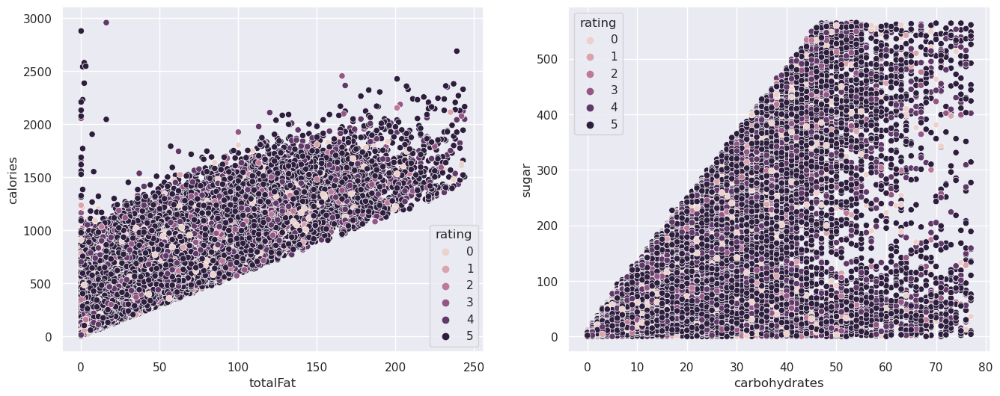

In [51]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(16,6));
sns.scatterplot(data=df, x="totalFat", y="calories", hue="rating",ax=ax1);
sns.scatterplot(data=df, x="carbohydrates", y="sugar" , hue="rating",ax=ax2);

In [52]:
df.groupby('year')['month']

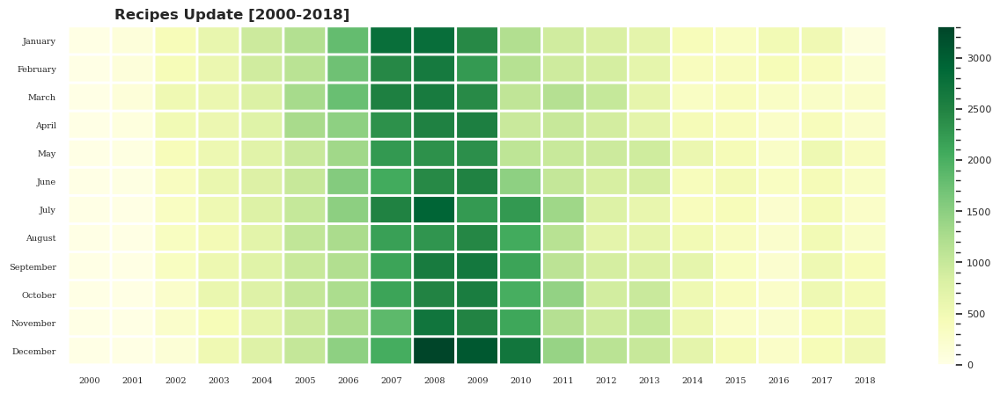

In [53]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'][::-1]
date_added_df = df.groupby('year')['month'].value_counts().unstack().fillna(0).T
date_added_df.index = month_order
plt.figure(figsize=(15, 5))
plt.pcolor(date_added_df, cmap='YlGn', edgecolors='white', linewidths=2) # heatmap
plt.xticks(np.arange(0.5, len(date_added_df.columns), 1), date_added_df.columns, fontsize=7, fontfamily='serif')
plt.yticks(np.arange(0.5, len(date_added_df.index), 1), date_added_df.index, fontsize=7, fontfamily='serif')

plt.title(f'Recipes Update [{df.year.min()}-{df.year.max()}]', fontsize=12, fontfamily='calibri', fontweight='bold', position=(0.20, 1.0+0.02))
cbar = plt.colorbar()

cbar.ax.tick_params(labelsize=8) 
cbar.ax.minorticks_on()
plt.show()

Year wise analysis

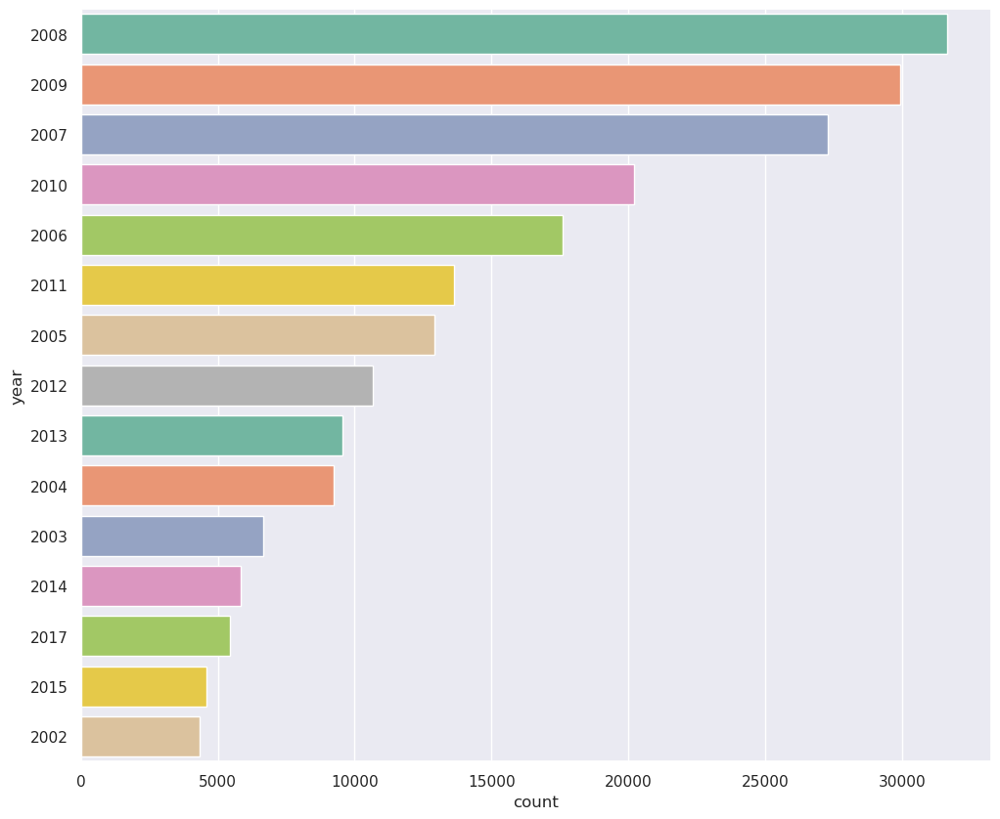

In [54]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="year", data=df, palette="Set2", order=df['year'].value_counts().index[0:15])

The top ten calorie-dense dishes are as follows:

In [55]:
top_calories = df.sort_values(by='calories', ascending=False)[0:15]
top_calories.name

172513                                         red wine essence
111751                                       irish black velvet
151522           p f  chang s chang s spare ribs by todd wilbur
200767                                       strawberry cordial
226581    white sangria with fresh strawberries  mango and mint
2023                                      a peach infused vodka
131313                                         marsala marinade
142646                                    nana s shepherd s pie
161658                                   plum rapture   cordial
210048                         texan size almond crunch cookies
216136                          traditional irish guinness stew
169222                                          quick pie crust
132408                                     meat and cabbage pie
106072         holiday nut roll  americanized croatian nut roll
159576                                                pie shell
Name: name, dtype: object

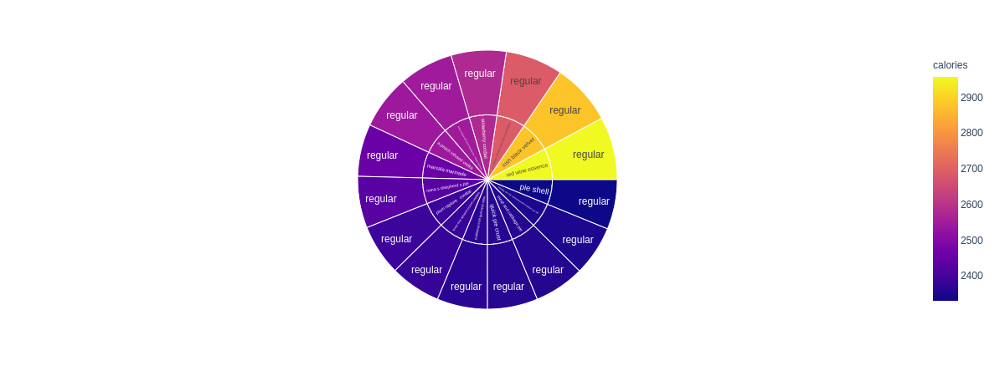

In [56]:
fig = px.sunburst(
    top_calories,
    path = ['name', 'diet'],
    values = 'calories',
    color = 'calories'
)
fig.show()

    Top ten high-calorie dishes for a regular diet.

### GET recipe image using API

In [57]:
import requests
from IPython.display import Image, HTML

def get_image(name):
    name = ' '.join(name.split(' ')[-2:])
    url = f"https://api.spoonacular.com/recipes/complexSearch?query={name}&number=1&apiKey=fe086d167d2b4b0fb0f5e03b790e9811"
    x = requests.get(url)
    try:
        path_to_image_html = x.json()['results'][0]['image']
        return path_to_image_html
    except:
        return

Image(url = get_image('piza  pizza'))

In [58]:
ten = df.head(10)[['name']]
ten['image'] = ten.name.apply(get_image)
ten.set_index('name', inplace=True)
ten

,image
name,
arriba baked winter squash mexican style,https://spoonacular.com/recipeImages/651575-312x231.jpg
a bit different breakfast pizza,None
all in the kitchen chili,https://spoonacular.com/recipeImages/638557-312x231.jpg
alouette potatoes,https://spoonacular.com/recipeImages/657031-312x231.jpg
amish tomato ketchup for canning,None
apple a day milk shake,https://spoonacular.com/recipeImages/716351-312x231.jpg
aww marinated olives,None
berry good sandwich spread,https://spoonacular.com/recipeImages/641025-312x231.jpg
boat house collard greens,https://spoonacular.com/recipeImages/13265-312x231.jpg


# Word cloud 

Word cloud of some string-type columns to see the most used words in each column.

In [59]:
def WordCloudPlot(df, column, save=False):
    # text = ' '.join(df[column].tolist())
    text = df[column].str.cat(sep=' ')
    # Generate a word cloud image
    mask = np.array(PIL.Image.open(mask_wordcloud))
    wcloud = WordCloud(
        stopwords=STOPWORDS, 
        background_color="white", 
        mode="RGBA", 
        max_words=1000, 
        mask=mask
    ).generate(text)

    # create coloring from image
    image_colors = ImageColorGenerator(mask)
    plt.figure(figsize=[14,10])
    plt.imshow(wcloud.recolor(color_func=image_colors), interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word cloud for {column}")
    # store to file
    if save:
        plt.savefig(f"img/wcloud_{column}.png", format="png")
    
    plt.show()

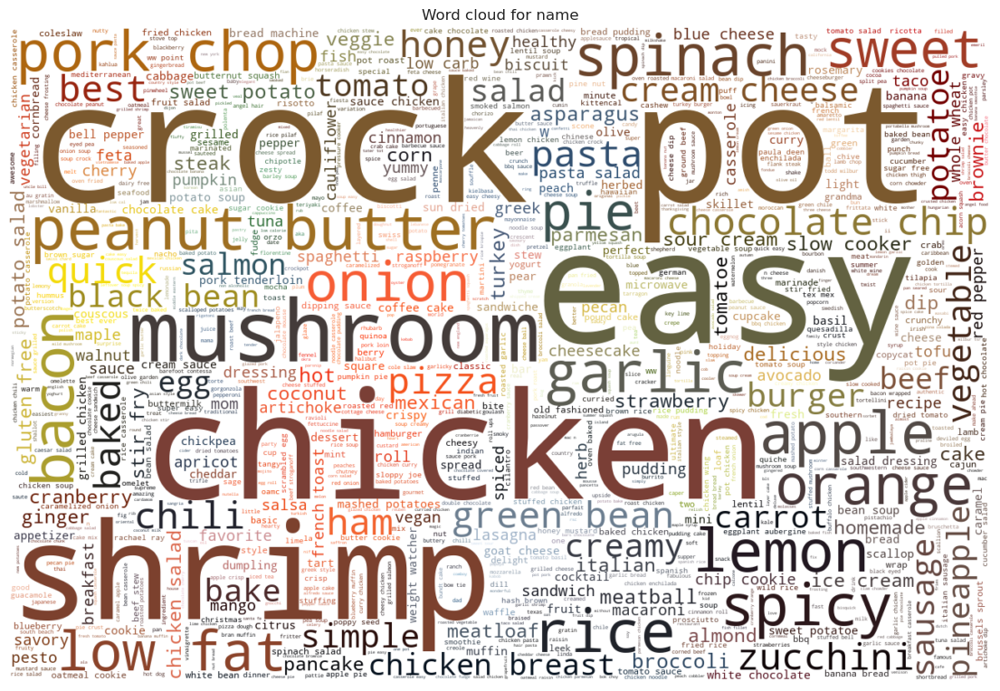

In [60]:
WordCloudPlot(df, 'name')

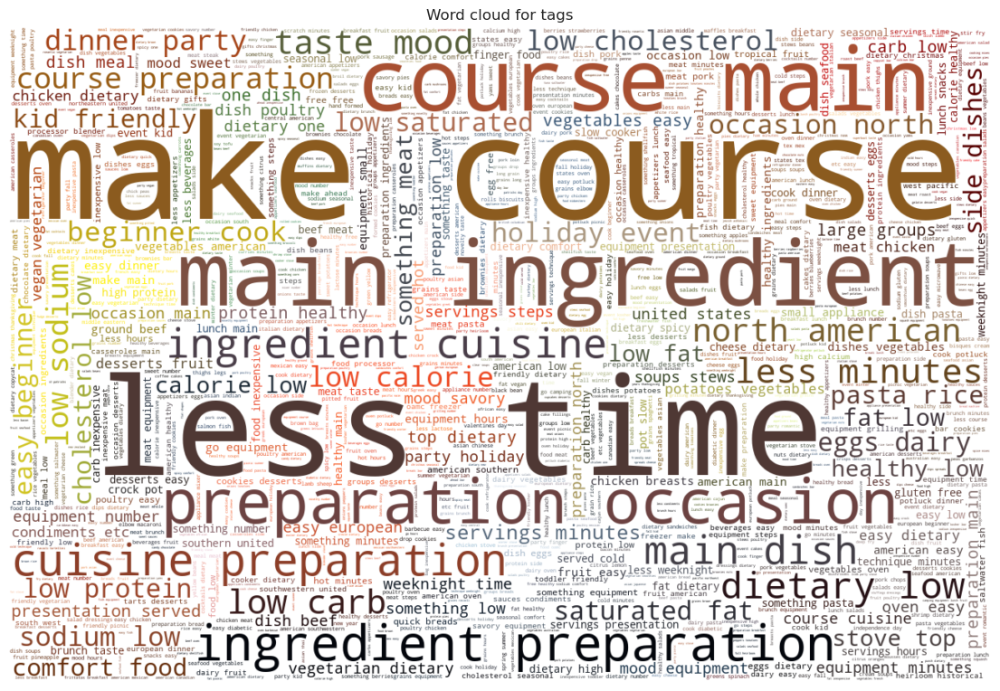

In [61]:
WordCloudPlot(df, 'tags')

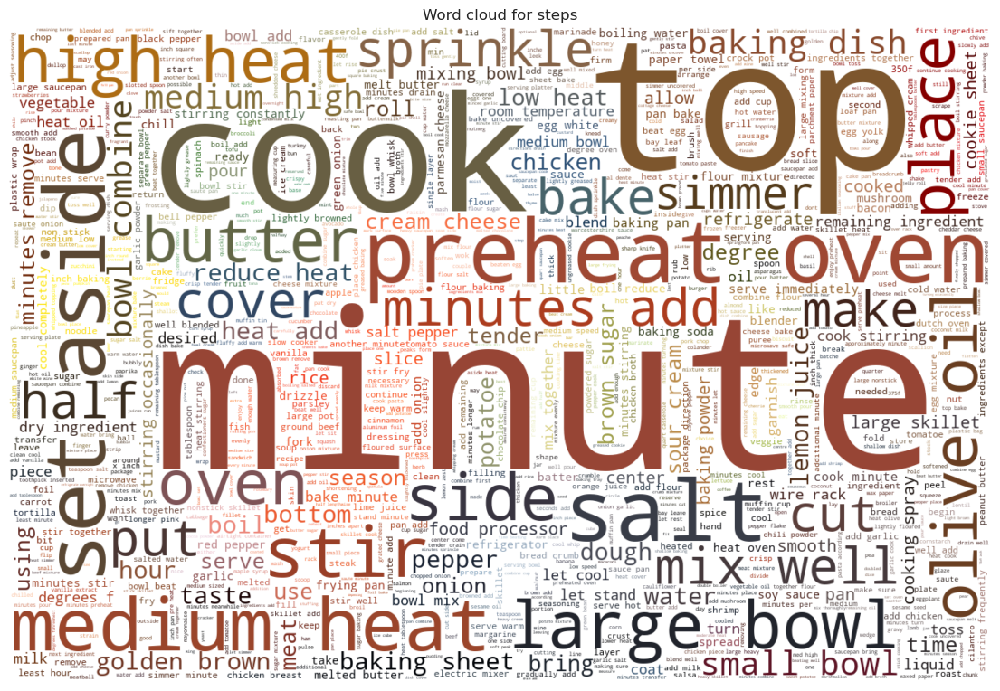

In [62]:
WordCloudPlot(df, 'steps')

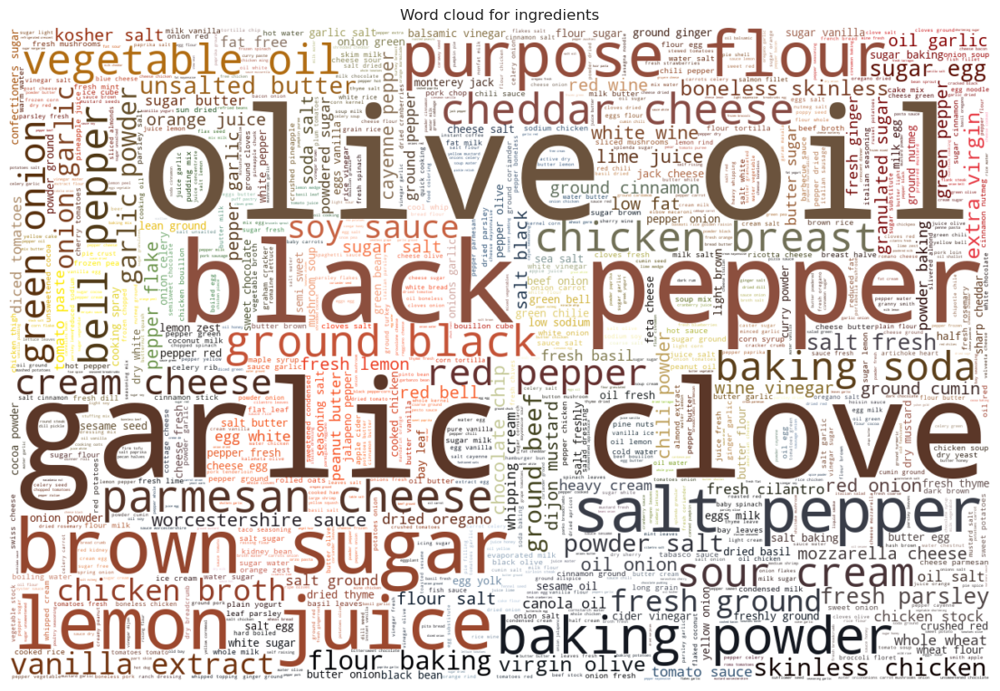

In [63]:
WordCloudPlot(df, 'ingredients')

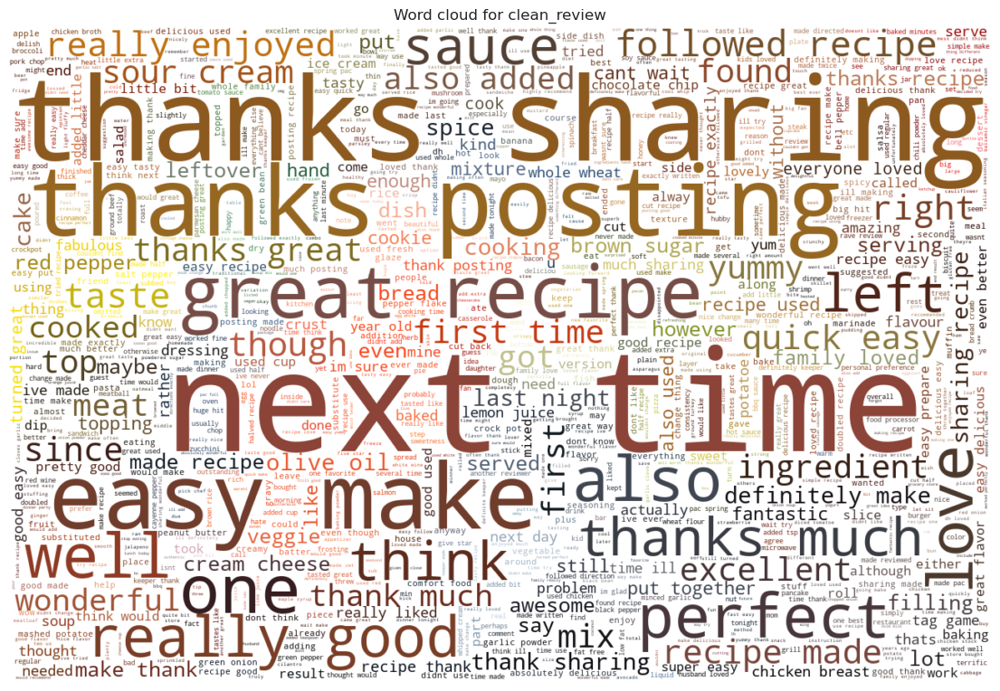

In [64]:
WordCloudPlot(df, 'clean_review')

Reset index and save dataset.

In [65]:
df.reset_index(drop=True, inplace=True)

In [66]:
save_dir = 'Food.com Recipes and Interactions/Exploratory data analysis'
os.makedirs(save_dir, exist_ok=True)  
df.to_csv(save_dir+'/food_out.csv') 